# Project Introduction



---

<p align="justify">
Machine learning has been evovling rapidly since its birth and has helped millions across different platforms and work domains. In this digital world there are millions of artist with millions of songs online and there's a very short time to explore all those songs. Machine learning will be a great player to explore music and get recommendations according to our taste. We will feed dataset to the machine learning algorithms and expect at the end of the project to recommend some songs according to our taste.
</p>



---



# Project Outline

---



*   Libraries and Dataset Prepration
*   Exploratory Data Analysis

*   Data Pre-Processing

*   Models Implementation





---





# Import libraries and Dataset

First of all let's import the dataset from kaggle website to our notebook 

In [ ]:
!kaggle datasets download -d yamaerenay/spotify-dataset-19212020-600k-tracks  

 96% 184M/193M [00:02<00:00, 113MB/s]
100% 193M/193M [00:02<00:00, 98.7MB/s]


Unzip the dataset

In [ ]:
!unzip /content/spotify-dataset-19212020-600k-tracks.zip 

Archive:  /content/spotify-dataset-19212020-600k-tracks.zip
  inflating: artists.csv             
  inflating: dict_artists.json       
  inflating: tracks.csv              


Import all the libraries needed.

In [1]:
import os
import spotipy
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.offline as py
import plotly.express as px
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from collections import defaultdict
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from spotipy.oauth2 import SpotifyClientCredentials
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder

import warnings
warnings.filterwarnings('ignore')

In [2]:
#!pip install matplotlib --upgrade

Read the dataset files -  Due to limited hardware resources we are not going to choose all the dataset and hence limit the size of dataset that we are going to use by using the .iloc method to read the number of lines specified.

In [3]:
artist_df = pd.read_csv(r'C:\Data\artists.csv').iloc[:10000]
track_df = pd.read_csv(r'C:\Data\tracks.csv').iloc[:10000]

Let's check out the shape of the dataframes that we have imported.

In [4]:
artist_df.shape

(10000, 5)

In [5]:
track_df.shape

(10000, 20)

# Data Pre-Processing

Let's check out the dimensions and attributes of the datsets and start pre-processing to get the dataset ready for future models' implementations.

In [6]:
artist_df.shape 

(10000, 5)

In [7]:
artist_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          10000 non-null  object 
 1   followers   10000 non-null  float64
 2   genres      10000 non-null  object 
 3   name        10000 non-null  object 
 4   popularity  10000 non-null  int64  
dtypes: float64(1), int64(1), object(3)
memory usage: 390.8+ KB


It can be observed that the 'artists' dataframe has five attributes and each of the artist has a unique id with number of followers, the genre of the artist, name and popularity of artist.

In [8]:
artist_df.head(7) 

,id,followers,genres,name,popularity
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0
5,0DotfDlYMGqkbzfBhcA5r6,7.0,[],Astral Affect,0
6,0DqP3bOCiC48L8SM9gK4W8,1.0,[],Yung Seed,0


In [9]:
artist_df.describe() 

,followers,popularity
count,1.000000e+04,10000.000000
mean,1.458712e+04,16.655900
std,8.168522e+04,18.581927
min,0.000000e+00,0.000000
25%,3.000000e+00,0.000000
50%,4.200000e+01,7.000000
75%,4.108000e+03,34.000000
max,4.562300e+06,89.000000


In [10]:
track_df.shape

(10000, 20)

In [11]:
track_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                10000 non-null  object 
 1   name              10000 non-null  object 
 2   popularity        10000 non-null  int64  
 3   duration_ms       10000 non-null  int64  
 4   explicit          10000 non-null  int64  
 5   artists           10000 non-null  object 
 6   id_artists        10000 non-null  object 
 7   release_date      10000 non-null  object 
 8   danceability      10000 non-null  float64
 9   energy            10000 non-null  float64
 10  key               10000 non-null  int64  
 11  loudness          10000 non-null  float64
 12  mode              10000 non-null  int64  
 13  speechiness       10000 non-null  float64
 14  acousticness      10000 non-null  float64
 15  instrumentalness  10000 non-null  float64
 16  liveness          10000 non-null  float64

The 'tracks' dataframe has 20 attributes with each unique id of the song, its name, popularity, energy and other attributes.

In [92]:
track_df.head(7)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artist_cnt,artist_xs,artist_id_xs
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,[Uli],[45tIt06XoI0Iio4LBEVpls],1922-02-22,0.645,0.4450,...,0.4510,0.674,0.7440,0.1510,0.1270,104.851,3,1,Uli,45tIt06XoI0Iio4LBEVpls
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,[Fernando Pessoa],[14jtPCOoNZwquk5wd9DxrY],1922-06-01,0.695,0.2630,...,0.9570,0.797,0.0000,0.1480,0.6550,102.009,1,1,Fernando Pessoa,14jtPCOoNZwquk5wd9DxrY
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,[Ignacio Corsini],[5LiOoJbxVSAMkBS2fUm3X2],1922-03-21,0.434,0.1770,...,0.0512,0.994,0.0218,0.2120,0.4570,130.418,5,1,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,[Ignacio Corsini],[5LiOoJbxVSAMkBS2fUm3X2],1922-03-21,0.321,0.0946,...,0.0504,0.995,0.9180,0.1040,0.3970,169.980,3,1,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,[Dick Haymes],[3BiJGZsyX9sJchTqcSA7Su],1922,0.402,0.1580,...,0.0390,0.989,0.1300,0.3110,0.1960,103.220,4,1,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su
5,0BRXJHRNGQ3W4v9frnSfhu,Ave Maria,0,178933,0,[Dick Haymes],[3BiJGZsyX9sJchTqcSA7Su],1922,0.227,0.2610,...,0.0382,0.994,0.2470,0.0977,0.0539,118.891,4,1,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su
6,0Dd9ImXtAtGwsmsAD69KZT,La Butte Rouge,0,134467,0,[Francis Marty],[2nuMRGzeJ5jJEKlfS7rZ0W],1922,0.510,0.3550,...,0.1240,0.965,0.0000,0.1550,0.7270,85.754,5,1,Francis Marty,2nuMRGzeJ5jJEKlfS7rZ0W


In [13]:
track_df.describe()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,1.858200,1.874455e+05,0.003200,0.587822,0.264799,4.923100,-15.383102,0.719500,0.285093,0.872792,0.277878,0.210865,0.586810,111.385041,3.753300
std,5.160538,9.556028e+04,0.056481,0.162751,0.150744,3.473211,5.411000,0.449266,0.365323,0.197037,0.373015,0.150143,0.234606,31.125500,0.698633
min,0.000000,3.344000e+03,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.509960e+05,0.000000,0.479000,0.165000,2.000000,-19.363000,0.000000,0.046400,0.840000,0.000000,0.112000,0.416000,86.691500,4.000000
50%,0.000000,1.774930e+05,0.000000,0.629000,0.241000,5.000000,-15.002000,1.000000,0.076000,0.970000,0.007370,0.157000,0.619000,111.208500,4.000000
75%,1.000000,1.943580e+05,0.000000,0.710000,0.327000,8.000000,-11.475000,1.000000,0.356000,0.992000,0.689000,0.264250,0.772000,126.702250,4.000000
max,65.000000,3.093226e+06,1.000000,0.956000,1.000000,11.000000,0.674000,1.000000,0.969000,0.996000,0.993000,0.973000,0.986000,221.741000,5.000000


<p align="justify">
The pandas describe function gives us valuable information about the dataset like we can see from the above output that 'popularity' coloumn has a value range of 0-100 where 0 is the minimum of the popularity of any song and 100 is the maximum popularity that any song has recieved yet with 'energy' which is maximum of 1 and a minimum of 0.
</p>

<p align="justify">
First of all we have some datatypes as 'object' in our dataframe, so we are going to change those data types to lists . We will do this for the coloumns like 'artists', 'id_artists' and genre. We are also going to change the 'name' coloum to string type.
<p/>

In [14]:
# Function to convert the object data types to lists
def convert(dfo):
  x = [listt.replace("[", " ").replace("]", " ").replace("'", " ").strip().split(',') for listt in dfo]
  return x

In [15]:
artist_df['name'] = artist_df['name'].astype('str')

In [16]:
track_df['name'] = track_df['name'].astype('str')

In [17]:
# Converting the genres colomn from artist df to list data type
artist_df['genres'] = convert(artist_df['genres'])

In [18]:
# Converting the id_artists colomn from tracks df to list data type
track_df['id_artists'] = convert(track_df['id_artists'])

In [19]:
# converting the artists coloumn in track_df to a list
track_df['artists'] = convert(track_df['artists'])

In [20]:
# Taking the count of artist in id_artists 
track_df['artist_cnt'] = [len(lst) for lst in track_df['id_artists']]

let's take a look at these coloumns again.

In [21]:
artist_df.head()

,id,followers,genres,name,popularity
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0


In [22]:
track_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artist_cnt
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,[Uli],[45tIt06XoI0Iio4LBEVpls],1922-02-22,0.645,0.4450,...,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3,1
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,[Fernando Pessoa],[14jtPCOoNZwquk5wd9DxrY],1922-06-01,0.695,0.2630,...,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,[Ignacio Corsini],[5LiOoJbxVSAMkBS2fUm3X2],1922-03-21,0.434,0.1770,...,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5,1
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,[Ignacio Corsini],[5LiOoJbxVSAMkBS2fUm3X2],1922-03-21,0.321,0.0946,...,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3,1
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,[Dick Haymes],[3BiJGZsyX9sJchTqcSA7Su],1922,0.402,0.1580,...,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4,1


let's check if the coloumns have been converted to lists

In [23]:
track_df['artists'][20][0]

'Jeanne Saint Bonnet'

In [24]:
track_df['id_artists'][20][0]

'4ZACxcKyd37u9WSxCAvLP2'

In [25]:
artist_df['genres'][400][0]

'chamame'

As we can see that our attributes have been converted into an array. **let's check out the duplicates in our dataset and remove them in this stage.**

In [26]:
#track_df[track_df['artists'].duplicated(keep=False)] 

In [27]:
def jcol(dft):
  xx = [','.join(listt) for listt  in dft]
  return xx

In [28]:
track_df['artist_xs'] = jcol(track_df['artists'])
track_df['artist_id_xs'] = jcol(track_df['id_artists'])

In [29]:
track_df.drop_duplicates(subset=['name', 'artist_xs', 'artist_id_xs'], keep='last', inplace=True, ignore_index=False)

In [30]:
# Let's check the shape of the dataset again to verify duplicate removal
track_df.shape

(9281, 23)

<p align='justify'>
As we can see that the duplicate entries have been removed. The previous tracks dataset shape was around 586k and now its down to 526k. There were multiple entries of tracks that have been eradicated. The column in the artists dataframe can have duplicates like genres to different singers or similar popularity so we can do the same procedure of duplicate removal there so we will be leaving it like that to use it later.
<p/>

<p align='justify'/>
The tracks dataset doesn't contain the genre attribute as it is in the artists dataframe so we will be using the pandas' explode function to get each row for every two artists in a song and later merge the both datasets on the basis of id and that would be great to use for later models and we will have a single dataframe to deal with. It will provide us with more valuable information.
<p/>

In [31]:
# Use explode on the basis of 'id_artists' on the tracks dataset
artist_track = track_df.explode('id_artists')

In [32]:
# Now merge the both datasets with a left join
df_at = artist_track.merge(artist_df, how='left', left_on='id_artists', right_on='id')

In [33]:
# Let's check out the new dataset that we have created
df_at.head(10)

,id_x,name_x,popularity_x,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,tempo,time_signature,artist_cnt,artist_xs,artist_id_xs,id_y,followers,genres,name_y,popularity_y
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,[Uli],45tIt06XoI0Iio4LBEVpls,1922-02-22,0.645,0.4450,...,104.851,3,1,Uli,45tIt06XoI0Iio4LBEVpls,NaN,NaN,NaN,NaN,NaN
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,[Fernando Pessoa],14jtPCOoNZwquk5wd9DxrY,1922-06-01,0.695,0.2630,...,102.009,1,1,Fernando Pessoa,14jtPCOoNZwquk5wd9DxrY,NaN,NaN,NaN,NaN,NaN
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,[Ignacio Corsini],5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.434,0.1770,...,130.418,5,1,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,NaN,NaN,NaN,NaN,NaN
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,[Ignacio Corsini],5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.321,0.0946,...,169.980,3,1,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,NaN,NaN,NaN,NaN,NaN
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,[Dick Haymes],3BiJGZsyX9sJchTqcSA7Su,1922,0.402,0.1580,...,103.220,4,1,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su,NaN,NaN,NaN,NaN,NaN
5,0BRXJHRNGQ3W4v9frnSfhu,Ave Maria,0,178933,0,[Dick Haymes],3BiJGZsyX9sJchTqcSA7Su,1922,0.227,0.2610,...,118.891,4,1,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su,NaN,NaN,NaN,NaN,NaN
6,0Dd9ImXtAtGwsmsAD69KZT,La Butte Rouge,0,134467,0,[Francis Marty],2nuMRGzeJ5jJEKlfS7rZ0W,1922,0.510,0.3550,...,85.754,5,1,Francis Marty,2nuMRGzeJ5jJEKlfS7rZ0W,NaN,NaN,NaN,NaN,NaN
7,0IA0Hju8CAgYfV1hwhidBH,La Java,0,161427,0,[Mistinguett],4AxgXfD7ISvJSTObqm4aIE,1922,0.563,0.1840,...,133.088,3,1,Mistinguett,4AxgXfD7ISvJSTObqm4aIE,NaN,NaN,NaN,NaN,NaN
8,0IgI1UCz84pYeVetnl1lGP,Old Fashioned Girl,0,310073,0,[Greg Fieler],5nWlsH5RDgFuRAiDeOFVmf,1922,0.488,0.4750,...,139.952,4,1,Greg Fieler,5nWlsH5RDgFuRAiDeOFVmf,NaN,NaN,NaN,NaN,NaN
9,0OYGe21oScKJfanLyM7daU,Capítulo 2.8 - Banquero Anarquista,0,99100,0,[Fernando Pessoa],14jtPCOoNZwquk5wd9DxrY,1922-06-01,0.676,0.2350,...,96.777,3,1,Fernando Pessoa,14jtPCOoNZwquk5wd9DxrY,NaN,NaN,NaN,NaN,NaN



**Now, In the combined dataset we got two coloumns that we already had namely 'id' and 'name' so we will remove these coloumns from our new dataset and then rename the few coloumns that on merge have been modfied like 'id' to 'id_x'.
Besides that, we have two 'popularity' coloumns and it is to be noted that one is for artists' popularity and the other is for tracks' popularity so we will change those coloumn names according to our needs.**

In [34]:
# Let's rename our coloumns first

df_at.rename(columns={'id_x':'tracks_id', 'name_x':'track_name', 'popularity_x':'tracks_popularity', 'popularity_y':'artist_popularity' , 'followers':'artist_followers'}, inplace=True)

In [35]:
# Now let's drop the unnecessary coloumns

df_at.drop(columns=['id_y', 'name_y'], inplace=True)

In [36]:
df_at.head(7)

,tracks_id,track_name,tracks_popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,liveness,valence,tempo,time_signature,artist_cnt,artist_xs,artist_id_xs,artist_followers,genres,artist_popularity
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,[Uli],45tIt06XoI0Iio4LBEVpls,1922-02-22,0.645,0.4450,...,0.1510,0.1270,104.851,3,1,Uli,45tIt06XoI0Iio4LBEVpls,NaN,NaN,NaN
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,[Fernando Pessoa],14jtPCOoNZwquk5wd9DxrY,1922-06-01,0.695,0.2630,...,0.1480,0.6550,102.009,1,1,Fernando Pessoa,14jtPCOoNZwquk5wd9DxrY,NaN,NaN,NaN
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,[Ignacio Corsini],5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.434,0.1770,...,0.2120,0.4570,130.418,5,1,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,NaN,NaN,NaN
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,[Ignacio Corsini],5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.321,0.0946,...,0.1040,0.3970,169.980,3,1,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,NaN,NaN,NaN
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,[Dick Haymes],3BiJGZsyX9sJchTqcSA7Su,1922,0.402,0.1580,...,0.3110,0.1960,103.220,4,1,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su,NaN,NaN,NaN
5,0BRXJHRNGQ3W4v9frnSfhu,Ave Maria,0,178933,0,[Dick Haymes],3BiJGZsyX9sJchTqcSA7Su,1922,0.227,0.2610,...,0.0977,0.0539,118.891,4,1,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su,NaN,NaN,NaN
6,0Dd9ImXtAtGwsmsAD69KZT,La Butte Rouge,0,134467,0,[Francis Marty],2nuMRGzeJ5jJEKlfS7rZ0W,1922,0.510,0.3550,...,0.1550,0.7270,85.754,5,1,Francis Marty,2nuMRGzeJ5jJEKlfS7rZ0W,NaN,NaN,NaN


As it can be observed that the dataframe has been updated according to our needs.



---



**Let's move to the next phase of our data preprocessing part and cater Missing Values.**

In [37]:
df_at['artist_popularity'].isnull().values.any()

True

In [38]:
sum([np.isnan(t) for t in df_at['artist_popularity']])

13221

There are quite a number of values that are null in the artist popularity so we cant remove them all and hence we will fill them with some values.

In [39]:
# Let's fill the popularity value with zero as it is a numeric dtype column
df_at['artist_popularity'].fillna(0.0, inplace=True)
''' This insures that all the values have been filled with 0.0 '''

' This insures that all the values have been filled with 0.0 '

There are missing values in the 'genres' and they are not NaN or null so we can't take a sum but we do know that there are a lot of missing values in the data coloumn so we will fill those missing values with some other keyword.

In [40]:
# Deal with missing genres and NANs
df_at['genres'].fillna('genre0', inplace=True)
df_at['genres'] = [['genre0'] if listt[0]=='' else listt for listt in df_at['genres']]

In [41]:
df_at['genres'] = jcol(df_at['genres'])


In [42]:
# Drop duplicates
df_at = df_at.drop_duplicates(subset=['tracks_id']) 

In [43]:
#reset the index and display the shape of dataset
df_at.reset_index(drop=True, inplace=True)
display(df_at.shape)

(9281, 26)

In [44]:
# Another headshot of the dataset
df_at.head(7)

,tracks_id,track_name,tracks_popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,liveness,valence,tempo,time_signature,artist_cnt,artist_xs,artist_id_xs,artist_followers,genres,artist_popularity
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,[Uli],45tIt06XoI0Iio4LBEVpls,1922-02-22,0.645,0.4450,...,0.1510,0.1270,104.851,3,1,Uli,45tIt06XoI0Iio4LBEVpls,NaN,"g,e,n,r,e,0",0.0
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,[Fernando Pessoa],14jtPCOoNZwquk5wd9DxrY,1922-06-01,0.695,0.2630,...,0.1480,0.6550,102.009,1,1,Fernando Pessoa,14jtPCOoNZwquk5wd9DxrY,NaN,"g,e,n,r,e,0",0.0
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,[Ignacio Corsini],5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.434,0.1770,...,0.2120,0.4570,130.418,5,1,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,NaN,"g,e,n,r,e,0",0.0
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,[Ignacio Corsini],5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.321,0.0946,...,0.1040,0.3970,169.980,3,1,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,NaN,"g,e,n,r,e,0",0.0
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,[Dick Haymes],3BiJGZsyX9sJchTqcSA7Su,1922,0.402,0.1580,...,0.3110,0.1960,103.220,4,1,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su,NaN,"g,e,n,r,e,0",0.0
5,0BRXJHRNGQ3W4v9frnSfhu,Ave Maria,0,178933,0,[Dick Haymes],3BiJGZsyX9sJchTqcSA7Su,1922,0.227,0.2610,...,0.0977,0.0539,118.891,4,1,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su,NaN,"g,e,n,r,e,0",0.0
6,0Dd9ImXtAtGwsmsAD69KZT,La Butte Rouge,0,134467,0,[Francis Marty],2nuMRGzeJ5jJEKlfS7rZ0W,1922,0.510,0.3550,...,0.1550,0.7270,85.754,5,1,Francis Marty,2nuMRGzeJ5jJEKlfS7rZ0W,NaN,"g,e,n,r,e,0",0.0


# Exploratory Data Analysis

<p align='justify'>
The datasets has been imported from kaggle and pre-processed successfully. Now we are ready to move forward, so let's start to explore these dataset with pandas and visually with different libraries that will help us understand the different correlations of attributes with each other and develope a better Music recommendor system.
<p/>

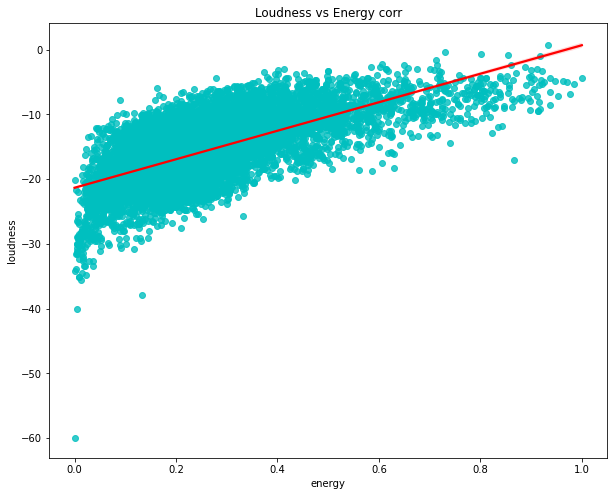

In [45]:
plt.figure(figsize=(10,8))
sns.regplot(data=df_at,y="loudness",x="energy",scatter_kws={"color": "c"}, line_kws={"color": "red"}).set(title="Loudness vs Energy corr");

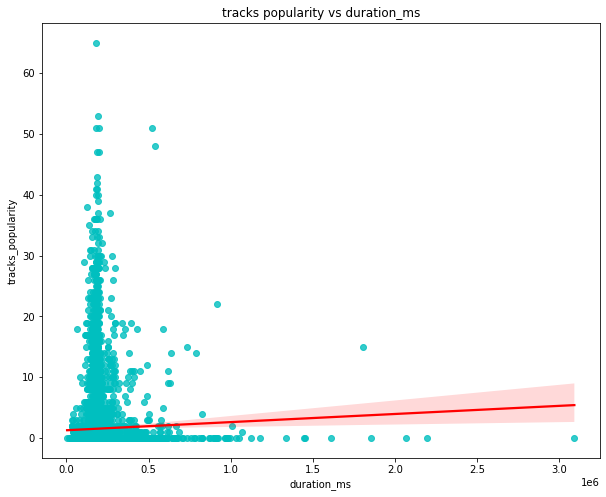

In [46]:
plt.figure(figsize=(10,8))
sns.regplot(data=df_at,y="tracks_popularity",x="duration_ms",scatter_kws={"color": "c"}, line_kws={"color": "red"}).set(title="tracks popularity vs duration_ms");

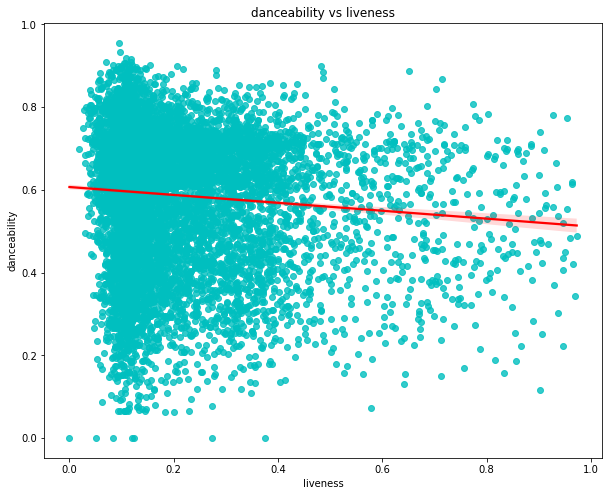

In [47]:
plt.figure(figsize=(10,8))
sns.regplot(data=df_at,y="danceability",x='liveness',scatter_kws={"color": "c"}, line_kws={"color": "red"}).set(title="danceability vs liveness");

In [48]:
# Crating a new coloumn year to be later used in the model
df_at['year'] = pd.to_datetime(df_at['release_date']).dt.year

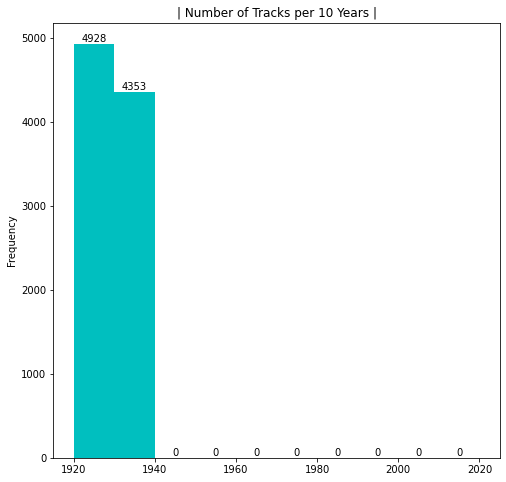

In [49]:
plt.figure(figsize=(8,8))
plt.title('| Number of Tracks per 10 Years |')
ax = df_at['year'].plot(kind='hist', color = 'c' , bins=10,range=[1920, 2020])
ax.bar_label(ax.containers[0])
plt.show()

In [50]:
figvar = ["energy", "liveness", "tempo", "valence", "loudness", "speechiness", "acousticness", "danceability", "instrumentalness"]

axis_x = df_at[figvar].values
axis_y = df_at["danceability"].values

mms = MinMaxScaler()
axis_x = mms.fit_transform(axis_x)

component = PCA(n_components=3)
component.fit(axis_x)

axis_x = component.transform(axis_x)

fig3d = go.Scatter3d(
    x=axis_x[:,0],
    y=axis_x[:,1],
    z=axis_x[:,2],
    text= artist_df["name"] + ' - ' + track_df['name'],
    mode="markers",  
    marker=dict( size=8, color=axis_y ))

fig5 = go.Figure(data=[fig3d])
fig5.show(renderer='iframe')

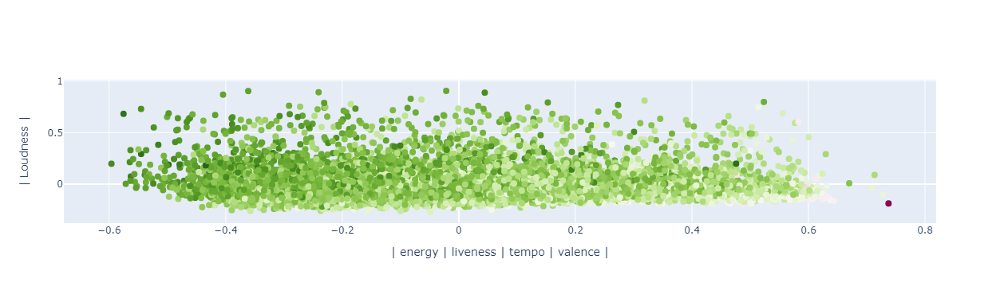

In [51]:
figvar = ["energy", "liveness", "tempo", "valence"]

axis_x = df_at[figvar].values
axis_y = df_at["loudness"].values

mms = MinMaxScaler()
axis_x = mms.fit_transform(axis_x)

component = PCA(n_components=2)
component.fit(axis_x)

axis_x = component.transform(axis_x)

fig = {
    "data": [
        {
            "x": axis_x[:, 0],
            "y": axis_x[:, 1],
            "text": artist_df["name"]  + ' - ' + track_df['name'],
            "mode": "markers",
            "marker": {"size": 8, "color": axis_y}
        }
    ],
    "layout": {
        "xaxis": {"title": "| energy | liveness | tempo | valence |"},
        "yaxis": {"title": "| Loudness |"}
    }
}

py.iplot(fig, filename="loudness vs eltv graph")

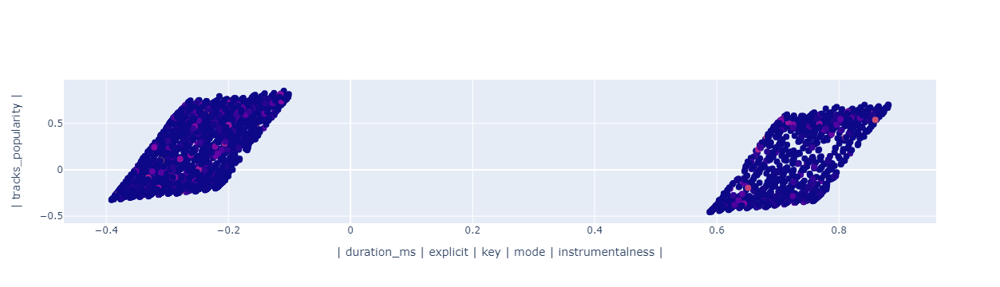

In [54]:
figvar = ['duration_ms', 'explicit', 'key', 'mode', "danceability", 'instrumentalness']

axis_x = df_at[figvar].values
axis_y = df_at["tracks_popularity"].values

mms = MinMaxScaler()
axis_x = mms.fit_transform(axis_x)

component = PCA(n_components=2)
component.fit(axis_x)

axis_x = component.transform(axis_x)

fig = {
    "data": [
        {
            "x": axis_x[:, 0],
            "y": axis_x[:, 1],
            "text": artist_df["name"]  + ' - ' + track_df['name'],
            "mode": "markers",
            "marker": {"size": 8, "color": axis_y}
        }
    ],
    "layout": {
        "xaxis": {"title": "| duration_ms | explicit | key | mode | instrumentalness |"},
        "yaxis": {"title": "| tracks_popularity |"}
    }
}

py.iplot(fig, filename="tracks_popularity vs dekmi grpah")

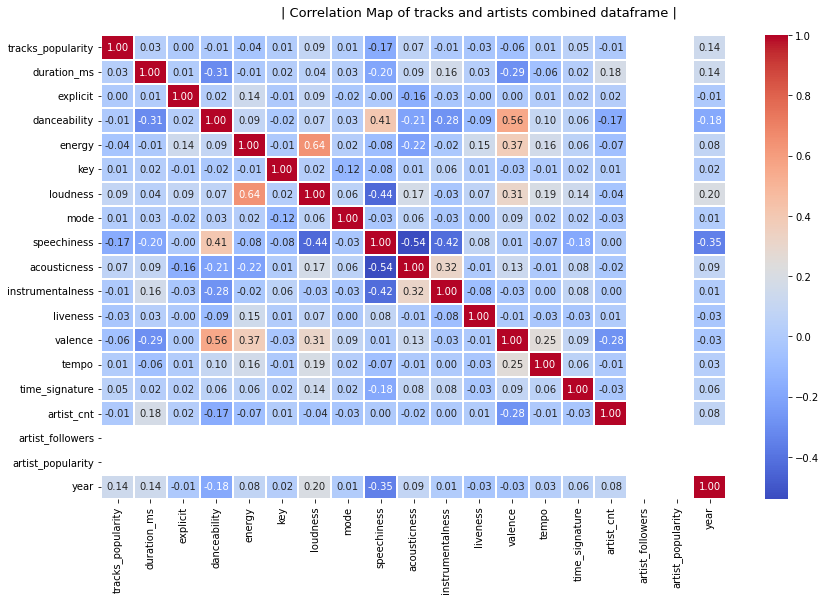

In [55]:
# Correlation Heatmap of attributes
f, ax = plt.subplots(figsize=(14, 8))
corr = df_at.corr()
hm = sns.heatmap(round(corr,2), annot=True, ax=ax, cmap="coolwarm", fmt='.2f', linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('| Correlation Map of tracks and artists combined dataframe |', fontsize=13)

The correlation heatmap shows us the relation of the attributes with each other, the more closer to 1 the values is the stronger is relation while 0 mean very negligible relation and negative value indicated the reverse like if the value goes up then that effects negatively on the df. like 'valence' and 'danceability' have a good relation as well as 'energy' and 'loudness' as it can be seen from the graph.

In [56]:
# Choose coloumns to apply min max scaler
mms_df = df_at[['tracks_popularity', 'danceability', 'energy', 'key', 'loudness', 'mode', 
               'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature','artist_popularity']]

In [57]:
#creating minmaxscaler object and apply it to the chosen coloumns above
scale = MinMaxScaler()
mms_df = pd.DataFrame(scale.fit_transform(mms_df), columns=mms_df.columns)

In [58]:
# let's take a look at the dataset sclaed
mms_df.head()

,tracks_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artist_popularity
0,0.092308,0.674686,0.4450,0.000000,0.769061,1.0,0.465428,0.676707,0.749245,0.155190,0.128803,0.472853,0.6,0.0
1,0.000000,0.726987,0.2630,0.000000,0.624056,1.0,0.987616,0.800201,0.000000,0.152107,0.664300,0.460037,0.2,0.0
2,0.000000,0.453975,0.1770,0.090909,0.639813,1.0,0.052838,0.997992,0.021954,0.217883,0.463489,0.588155,1.0,0.0
3,0.000000,0.335774,0.0946,0.636364,0.528052,1.0,0.052012,0.998996,0.924471,0.106886,0.402637,0.766570,0.6,0.0
4,0.000000,0.420502,0.1580,0.272727,0.710354,0.0,0.040248,0.992972,0.130916,0.319630,0.198783,0.465498,0.8,0.0


In [59]:
# One hot encode the varibles
ohe_df = df_at[['explicit', 'release_date']]
ohe_df = pd.get_dummies( ohe_df , columns=ohe_df.columns)

In [60]:
'''
tvec = TfidfVectorizer()

    # Fit and transform the data
tvec_matrix = tvec.fit_transform(df_at['genres'])
    
    # Put transformed data into a df
tf_df = pd.DataFrame(tvec_matrix.toarray(), columns=tvec.get_feature_names()) ''';

In [61]:
#tf_df.head()

In [62]:
# Concatinating the scaled and hot encoded dataset.
mod_df = pd.concat([df_at[['tracks_id','genres']],mms_df,ohe_df],axis=1) 

In [63]:
mod_df.head(10)

,tracks_id,genres,tracks_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,release_date_1935-01-12,release_date_1935-02-04,release_date_1935-05-01,release_date_1935-05-15,release_date_1935-05-29,release_date_1935-08-28,release_date_1935-10-16,release_date_1935-11-29,release_date_1935-12-01,release_date_1935-12-31
0,35iwgR4jXetI318WEWsa1Q,"g,e,n,r,e,0",0.092308,0.674686,0.4450,0.000000,0.769061,1.0,0.465428,0.676707,...,0,0,0,0,0,0,0,0,0,0
1,021ht4sdgPcrDgSk7JTbKY,"g,e,n,r,e,0",0.000000,0.726987,0.2630,0.000000,0.624056,1.0,0.987616,0.800201,...,0,0,0,0,0,0,0,0,0,0
2,07A5yehtSnoedViJAZkNnc,"g,e,n,r,e,0",0.000000,0.453975,0.1770,0.090909,0.639813,1.0,0.052838,0.997992,...,0,0,0,0,0,0,0,0,0,0
3,08FmqUhxtyLTn6pAh6bk45,"g,e,n,r,e,0",0.000000,0.335774,0.0946,0.636364,0.528052,1.0,0.052012,0.998996,...,0,0,0,0,0,0,0,0,0,0
4,08y9GfoqCWfOGsKdwojr5e,"g,e,n,r,e,0",0.000000,0.420502,0.1580,0.272727,0.710354,0.0,0.040248,0.992972,...,0,0,0,0,0,0,0,0,0,0
5,0BRXJHRNGQ3W4v9frnSfhu,"g,e,n,r,e,0",0.000000,0.237448,0.2610,0.454545,0.785460,1.0,0.039422,0.997992,...,0,0,0,0,0,0,0,0,0,0
6,0Dd9ImXtAtGwsmsAD69KZT,"g,e,n,r,e,0",0.000000,0.533473,0.3550,0.363636,0.777384,1.0,0.127967,0.968876,...,0,0,0,0,0,0,0,0,0,0
7,0IA0Hju8CAgYfV1hwhidBH,"g,e,n,r,e,0",0.000000,0.588912,0.1840,0.363636,0.762155,1.0,0.052838,0.996988,...,0,0,0,0,0,0,0,0,0,0
8,0IgI1UCz84pYeVetnl1lGP,"g,e,n,r,e,0",0.000000,0.510460,0.4750,0.000000,0.721528,0.0,0.041176,0.622490,...,0,0,0,0,0,0,0,0,0,0
9,0OYGe21oScKJfanLyM7daU,"g,e,n,r,e,0",0.000000,0.707113,0.2350,1.000000,0.618931,0.0,0.990712,0.797189,...,0,0,0,0,0,0,0,0,0,0


In [64]:
mod_df.shape 

(9281, 238)

# Models Implementation

### Clustering Genres with k-means

In [65]:
# Creating the pipeline cluster using pipeline from sklearn
# It will apply a list of transforms and a final estimator like in our case standardscaler and kmeans with number of cluster to apply
pipeline_cluster = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])

In [66]:
# Using the previous dataset that we merged in preprocessing
Xdt = mod_df.select_dtypes(np.number)
# Applying the pipeline to the dataset
pipeline_cluster.fit(Xdt)
# Assinging the predicted clusters to a new 'cluster' coloumn in the dataset
mod_df['cluster'] = pipeline_cluster.predict(Xdt)

In [67]:
# Using TSNE for the pipeline to create grpahs for the cluster later below
pipeline_tsne = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=2))])
embed_genre = pipeline_tsne.fit_transform(Xdt)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9281 samples in 0.019s...
[t-SNE] Computed neighbors for 9281 samples in 0.761s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9281
[t-SNE] Computed conditional probabilities for sample 2000 / 9281
[t-SNE] Computed conditional probabilities for sample 3000 / 9281
[t-SNE] Computed conditional probabilities for sample 4000 / 9281
[t-SNE] Computed conditional probabilities for sample 5000 / 9281
[t-SNE] Computed conditional probabilities for sample 6000 / 9281
[t-SNE] Computed conditional probabilities for sample 7000 / 9281
[t-SNE] Computed conditional probabilities for sample 8000 / 9281
[t-SNE] Computed conditional probabilities for sample 9000 / 9281
[t-SNE] Computed conditional probabilities for sample 9281 / 9281
[t-SNE] Mean sigma: 1.420705
[t-SNE] Computed conditional probabilities in 0.520s
[t-SNE] Iteration 50: error = 88.6411591, gradient norm = 0.0244420 (50 iterations in 3.874s)
[t-SNE] Iteration 100: 

In [68]:
# Genre and cluster coloumn to be used for x and y axis in the next graph for genre clustering that we performed
fig_project = pd.DataFrame(columns=['x', 'y'], data=embed_genre)
fig_project['genres'] = mod_df['genres']
fig_project['cluster'] = mod_df['cluster']

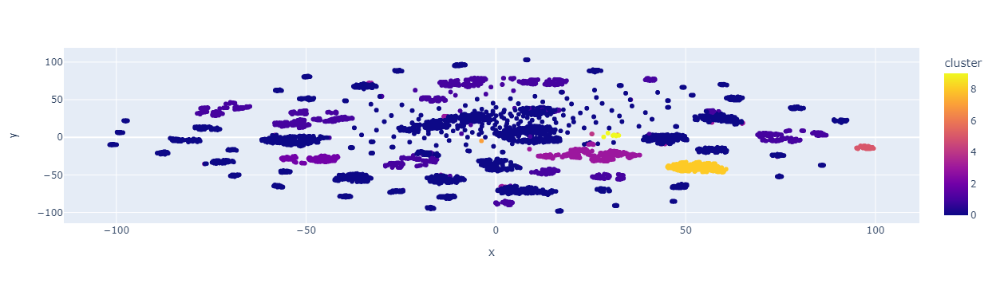

In [69]:
# Plotting the graph for clusters
fig6 = px.scatter( fig_project, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'] )
fig6.show()

### Creating Song's Cluster with k-means

In [70]:
df_spot = df_at[['track_name', 'artists' , 'year', 'duration_ms', 'explicit', 'key', 'mode', 'tracks_popularity', "energy", "liveness", "tempo", "valence", "loudness", "speechiness", "acousticness", "danceability", "instrumentalness"]]

In [71]:
# Creating pipeline for the songs now 
pipeline_songs = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=20, verbose=2))], verbose=True)
Xds = df_spot.select_dtypes(np.number)
pipeline_songs.fit(Xds)

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
Initialization complete
Iteration 0, inertia 81538.17320160787.
Iteration 1, inertia 61968.882398977454.
Iteration 2, inertia 59290.707605228024.
Iteration 3, inertia 58492.79310350992.
Iteration 4, inertia 58285.19704750665.
Iteration 5, inertia 58214.75461803968.
Iteration 6, inertia 58179.5047888635.
Iteration 7, inertia 58159.14376457908.
Iteration 8, inertia 58142.81019856798.
Iteration 9, inertia 58133.39385487188.
Iteration 10, inertia 58118.345736926974.
Iteration 11, inertia 58104.397365032906.
Iteration 12, inertia 58089.33381641087.
Iteration 13, inertia 58071.42991697831.
Iteration 14, inertia 58044.11443662455.
Iteration 15, inertia 57994.66528527755.
Iteration 16, inertia 57949.56264995375.
Iteration 17, inertia 57898.44345243633.
Iteration 18, inertia 57822.42186461313.
Iteration 19, inertia 57763.46985284069.
Iteration 20, inertia 57724.52233273588.
Iteration 21, inertia 57678.33625909723.
Iteration 

Pipeline(steps=[('scaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=20, verbose=2))],
         verbose=True)

In [72]:
# Creating another coloumn in the dataset to store clusters labels for songs
label_song_cluster = pipeline_songs.predict(Xds)
df_spot['cluster_label'] = label_song_cluster

In [73]:
# Building the pipeline to apply PCA
pipeline_pca = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
embed_songs = pipeline_pca.fit_transform(Xds)

In [74]:
# Choosing x and y axis for the grpahs
fig_project = pd.DataFrame(columns=['x', 'y'], data=embed_songs)
fig_project['title'] = df_spot['track_name']
fig_project['cluster'] = df_spot['cluster_label']

In [1]:
# Let's plot the graph
fig7 = px.scatter( fig_project, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'] )
fig7.show()

NameError: name 'px' is not defined

In [76]:
print(classification_report(df_spot['cluster_label'], fig_project['cluster']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1141
           1       1.00      1.00      1.00       844
           2       1.00      1.00      1.00       781
           3       1.00      1.00      1.00       377
           4       1.00      1.00      1.00       364
           5       1.00      1.00      1.00       973
           6       1.00      1.00      1.00        29
           7       1.00      1.00      1.00       599
           8       1.00      1.00      1.00       546
           9       1.00      1.00      1.00        31
          10       1.00      1.00      1.00       611
          11       1.00      1.00      1.00       429
          12       1.00      1.00      1.00       178
          13       1.00      1.00      1.00       384
          14       1.00      1.00      1.00       374
          15       1.00      1.00      1.00       259
          16       1.00      1.00      1.00       355
          17       1.00    

### Models Implementation (Content-Based Recommender System)

First of let's set the environment variables to be used later for token generation

In [77]:
%set_env client_id=os.environ["0626ef40deeb4a0badacc8f5803b689e"]
%set_env client_secret=os.environ["6691635bd9454024822b0b49e6e17848"]

env: client_id=os.environ["0626ef40deeb4a0badacc8f5803b689e"]
env: client_secret=os.environ["6691635bd9454024822b0b49e6e17848"]


Let's create the token using our spotify Client id and secret

In [78]:
token = SpotifyClientCredentials(client_id="0626ef40deeb4a0badacc8f5803b689e", client_secret="6691635bd9454024822b0b49e6e17848").get_access_token()

Printing the token that we generated above, let's see what we have got.

In [79]:
token

{'access_token': 'BQCQp8lDfFDJvmbbYCc_ieS5UX4xK6syiM65AgJVRTo1GWo1I9jdponW5LD_d4Mh0xho1ej8gnrtu3RZk8Bby3RIFPINS_wVzKLRlv-ZKkQXzsCifsg',
 'token_type': 'Bearer',
 'expires_in': 3600,
 'expires_at': 1660678266}

In the token we got an access token that expires every 60 min so we will have to generate the token again if we make any changes after an hour and re-run our project. Now let's authenticate the token and get access to spotify API using the Spotipy library.

In [80]:
# Creating the spotipy authenitaction object to be later used in the recommender system
sp = spotipy.Spotify(auth=token['access_token'])

In [81]:
# We are going to create a few functions for the recommendor system that will allow us to recommend songs
# Most of the function names describe the function well

# The following function finds the song on spotify if not found in the local database
def find_in_spotify(name, year):
    
    data_songs = defaultdict()

    product = sp.search(q= 'track: {} year: {} '.format(name, year), limit=1)
    
    if product['tracks']['items'] == []:
        return None
    
    product = product['tracks']['items'][0]

    track_id = product['id']
    
    audio_features = sp.audio_features(track_id)[0]
    
    data_songs['track_name'] = [name]
    data_songs['year'] = [year]
    data_songs['explicit'] = [int(product['explicit'])]
    data_songs['duration_ms'] = [product['duration_ms']]
    data_songs['tracks_popularity'] = [product['popularity']]
    
    for key, value in audio_features.items():
        data_songs[key] = value
    
    return pd.DataFrame(data_songs)
    

In [82]:
# Let's keep the attributes that are important to be used for songs prediction
cols = ['year', 'duration_ms', 'explicit', 'key', 'mode', 'tracks_popularity', "energy", "liveness", "tempo", "valence", "loudness", "speechiness", "acousticness", "danceability", "instrumentalness"]

# Get the data of songs from spotify using the find in spotify function above
def get_data_songs(song, df_spot):
    
    try:
        data_songs = df_spot[(df_spot['track_name'] == song['name'])  & (df_spot['year'] == song['year'])].iloc[0]
        return data_songs
    
    except IndexError:
        return find_in_spotify(song['name'], song['year'])

In [86]:
# Compute the mean for  every attribute that we choose in 'cols'
def mean_funx(songs_list, df_spot):
    
    vector_songs = []
    
    for song in songs_list:
        data_songs = get_data_songs(song, df_spot)
        if data_songs is None:
            print('Warning: {} could not be found in Spotify or in local DataFrame'.format(song['name']))
            continue
        song_vector = data_songs[cols].values
        vector_songs.append(song_vector)  
    
    song_matrix = np.array(list(vector_songs))
    return np.mean(song_matrix, axis=0)

In [84]:
# Function to flatten the songs list that we recieved in the below function 'recommendor'
def list_flatten(dict_list):
    
    dict_flat = defaultdict()
    for key in dict_list[0].keys():
        dict_flat[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            dict_flat[key].append(value)            
    return dict_flat
        
# Change the variable 'n_songs' to get the number of desired songs recommendations
def recommendor( songs_list, df_spot, n_songs=10):
    
    mt_cols = ['track_name', 'year', 'artists']
    song_dict = list_flatten(songs_list)
    
    # Compute the mean using the mean function
    mean_song = mean_funx(songs_list, df_spot)

    scaler = pipeline_songs.steps[0][1]
    
    scaled_data = scaler.transform(df_spot[cols])
    
    # scale/reshape the dataset between -1 and 1
    song_mean_scaled = scaler.transform(mean_song.reshape(1, -1))
    
    # Calulate the distance between the mean scaled songs and scaled data using cdist library
    calculate_dist = cdist(song_mean_scaled, scaled_data, 'cosine')
    
    list_ind = list(np.argsort(calculate_dist)[:, :n_songs][0])
    
    result_songs = df_spot.iloc[list_ind]
    result_songs = result_songs[~result_songs['track_name'].isin(song_dict['name'])]
    
    return result_songs[mt_cols].to_dict(orient='records')


In [90]:
# Let's input some songs and get some suggestions
recommendor([{'name': 'Lady of the Evening', 'year':1922},
                {'name': 'La Butte Rouge', 'year': 1922},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Ave Maria', 'year': 1922}],  df_spot)

[{'track_name': 'Green, Green Grass of Home',
  'year': 1935,
  'artists': ['The Ink Spots']},
 {'track_name': 'We Three', 'year': 1935, 'artists': ['The Ink Spots']},
 {'track_name': 'My Home Among The Hills',
  'year': 1935,
  'artists': ['The Carter Family']},
 {'track_name': 'Obsession', 'year': 1935, 'artists': ['Lys Gauty']},
 {'track_name': 'Cheatin Heart', 'year': 1935, 'artists': ['The Ink Spots']},
 {'track_name': 'Single Girl, Married Girl',
  'year': 1935,
  'artists': ['The Carter Family']},
 {'track_name': 'Pennies from Heaven (with Teddy Wilson & His Orchestra) - Take 2',
  'year': 1935,
  'artists': ['Billie Holiday ', '  Teddy Wilson']},
 {'track_name': 'Cold, Cold Heart',
  'year': 1935,
  'artists': ['The Ink Spots']},
 {'track_name': "He'll Have to Go",
  'year': 1935,
  'artists': ['The Ink Spots']},
 {'track_name': 'On the Rock Where Moses Stood',
  'year': 1935,
  'artists': ['The Carter Family']}]

In [94]:
# Let's input few more songs and get some suggestions
recommendor([{'name':'Tu Verras Montmartre', 'year': 1922 },
                 {'name': 'Thriller', 'year': 1982 }], df_spot)

[{'track_name': 'Truck Stop', 'year': 1935, 'artists': ['The Ink Spots']},
 {'track_name': "Ain't No Big Thing",
  'year': 1935,
  'artists': ['The Ink Spots']},
 {'track_name': "Your Mother's Son-In-Law (with Benny Goodman & His Orchestra)",
  'year': 1933,
  'artists': ['Billie Holiday ', '  Benny Goodman']},
 {'track_name': 'Gospel Ship', 'year': 1935, 'artists': ['The Carter Family']},
 {'track_name': "Billie's Blues - Take 1",
  'year': 1933,
  'artists': ['Billie Holiday']},
 {'track_name': "Blackie's Gunman",
  'year': 1935,
  'artists': ['The Carter Family']},
 {'track_name': "Life Begins When You're In Love (with Teddy Wilson & His Orchestra)",
  'year': 1933,
  'artists': ['Billie Holiday ', '  Teddy Wilson']},
 {'track_name': 'My Clinch Mountain Home',
  'year': 1935,
  'artists': ['The Carter Family']},
 {'track_name': 'Black Jack David',
  'year': 1935,
  'artists': ['The Carter Family']},
 {'track_name': 'Born to Love', 'year': 1933, 'artists': ['Billie Holiday']}]